---

# Knowledge Sources in CrewAI

## String knowledge source

---

In [19]:
from crewai.knowledge.source.string_knowledge_source import StringKnowledgeSource

# Define the knowledge
policy_text = """Our return policy allows customers to return any product within 30 days of purchase.
                 Refunds will be issued only if the item is unused and in original packaging.
                 Customers must provide proof of purchase when requesting a return."""

# Create a StringKnowledgeSource object
return_policy_knowledge = StringKnowledgeSource(content=policy_text)

In [20]:
from crewai import LLM

llm = LLM(model="gpt-4o")

In [21]:
from crewai import Agent

returns_agent = Agent(
    role="Product Returns Assistant",
    goal="Answer customer questions about return policy accurately.",
    backstory="You work in customer service and specialize in returns, refunds, and policies.",
    allow_delegation=False,
    verbose=True,
    llm=llm
)

In [22]:
from crewai import Task

returns_task = Task(
    description="Answer the following customer question about returns: {question}",
    expected_output="A concise and accurate answer.",
    agent=returns_agent
)

In [23]:
from crewai import Crew, Process

crew = Crew(
    agents=[returns_agent],
    tasks=[returns_task],
    process=Process.sequential,
    knowledge_sources=[return_policy_knowledge],  # This is key
    verbose=True
)

In [24]:
result = crew.kickoff(inputs={
    "question": "Can I get a refund if I used the item once?"
})

from pprint import pprint
pprint(result.raw)

╭──────────────────────────────────────────── Crew Execution Started ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Started                                                                                         │
│  Name: crew                                                                                                     │
│  ID: d26da5bb-7a04-48c0-b164-928ab502b191                                                                       │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

Output()

╭──────────────────────────────────────────── 📚 Retrieved Knowledge ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Additional Information: Our return policy allows customers to return any product within 30 days of purchase.   │
│                   Refunds will be issued only if the item is unused and in original packaging.                  │
│                   Customers must provide proof of purchase when requesting a return.                            │
│  {WindowsPath('knowledge/company_info.json'): 'company_name: TechNova Inc.\ndepartments:   -     name:          │
│  Product\n    head: Alice\n    teams:       -         name: UX Team\n        members: 5\n\n      -              │
│  na...                                                                                                          │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭─────────────────────────────────────────────── 🤖 Agent Started ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: Product Returns Assistant                                                                               │
│                                                                                                                 │
│  Task: Answer the following customer question about returns: Can I get a refund if I used the item once?        │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

Output()

╭───────────────────────────────────────────── ✅ Agent Final Answer ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: Product Returns Assistant                                                                               │
│                                                                                                                 │
│  Final Answer:                                                                                                  │
│  Unfortunately, according to our return policy, we can only issue refunds for items that are unused and in      │
│  their original packaging. Since the item has been used, it would not be eligible for a refund. However, you    │
│  may still want to keep the item for personal use. Please let us know if there's anything else we can assist    │
│  with.                                                                                                          │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Task Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Task Completed                                                                                                 │
│  Name: 000afca6-0141-443f-967a-0890a0a38a15                                                                     │
│  Agent: Product Returns Assistant                                                                               │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Crew Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Completed                                                                                       │
│  Name: crew                                                                                                     │
│  ID: d26da5bb-7a04-48c0-b164-928ab502b191                                                                       │
│  Tool Args:                                                                                                     │
│  Final Output: Unfortunately, according to our return policy, we can only issue refunds for items that are      │
│  unused and in their original packaging. Since the item has been used, it would not be eligible for a refund.   │
│  However, you may still want to keep the item for personal use. Please let us know if there's anything else we  │
│  can assist with.                                                                                               │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

('Unfortunately, according to our return policy, we can only issue refunds for '
 'items that are unused and in their original packaging. Since the item has '
 'been used, it would not be eligible for a refund. However, you may still '
 "want to keep the item for personal use. Please let us know if there's "
 'anything else we can assist with.')


---

## Web Knowledge Source
You need to install docling for the following example to work: `uv add docling`

### `docling` 👉 [Learn more](https://pypi.org/project/docling/):- **Docling** simplifies document processing, parsing diverse formats — including advanced PDF understanding — and providing seamless integrations with the gen AI ecosystem.

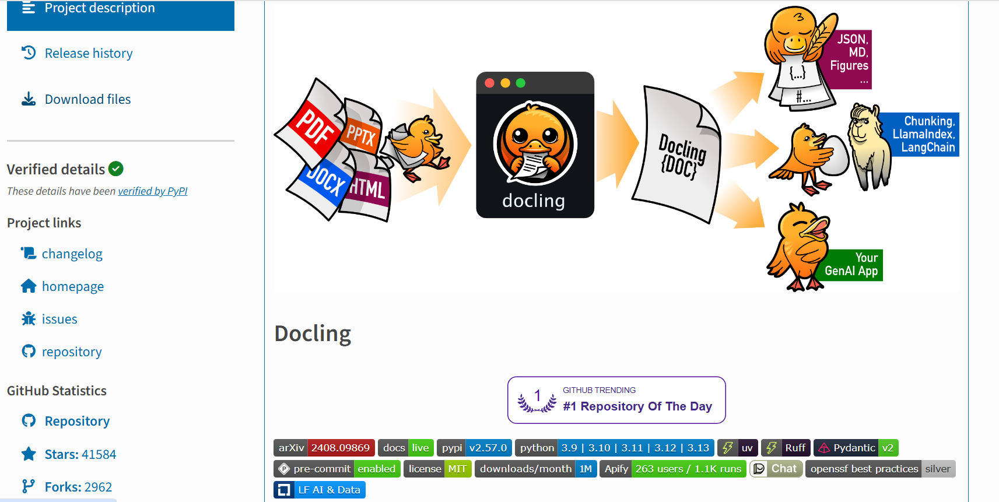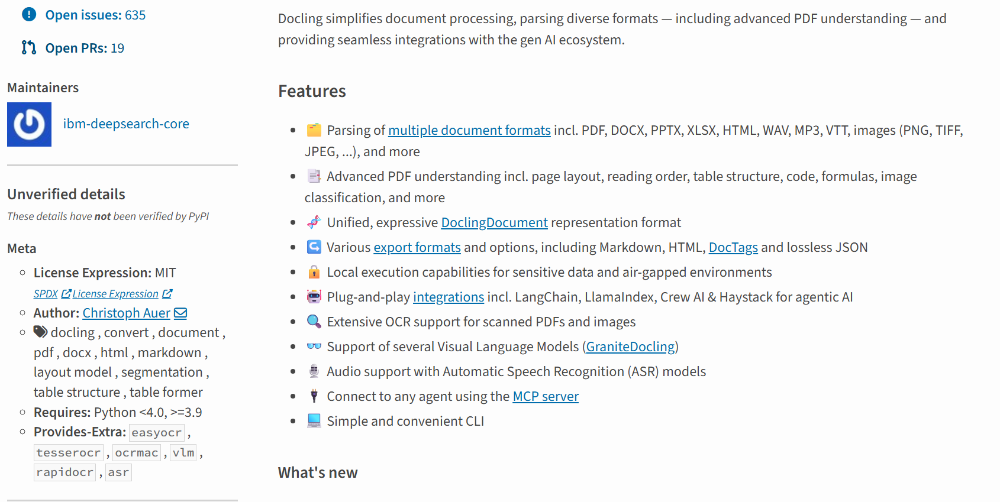

In [25]:
from crewai import LLM, Agent, Crew, Process, Task
from crewai.knowledge.source.crew_docling_source import CrewDoclingSource

# Create a knowledge source from web content
content_source = CrewDoclingSource(
    file_paths=[
        "https://lilianweng.github.io/posts/2024-11-28-reward-hacking",
        "https://lilianweng.github.io/posts/2024-07-07-hallucination",
    ],
)

# Create an LLM with a temperature of 0 to ensure deterministic outputs
llm = LLM(model="gpt-4o-mini", temperature=0)

# Create an agent with the knowledge store
agent = Agent(
    role="About papers",
    goal="You know everything about the papers.",
    backstory="You are a master at understanding papers and their content.",
    verbose=True,
    allow_delegation=False,
    llm=llm,
)

task = Task(
    description="Answer the following questions about the papers: {question}",
    expected_output="An answer to the question.",
    agent=agent,
)

crew = Crew(
    agents=[agent],
    tasks=[task],
    verbose=True,
    process=Process.sequential,
    knowledge_sources=[content_source],
)

result = crew.kickoff(
    inputs={"question": "What is the reward hacking paper about? Be sure to provide sources."}
)

2025-10-15 18:20:23,345 - INFO - detected formats: [<InputFormat.HTML: 'html'>]
2025-10-15 18:20:23,385 - INFO - Going to convert document batch...
2025-10-15 18:20:23,387 - INFO - Initializing pipeline for SimplePipeline with options hash 995a146ad601044538e6a923bea22f4e
2025-10-15 18:20:23,466 - INFO - Loading plugin 'docling_defaults'
2025-10-15 18:20:23,472 - INFO - Registered picture descriptions: ['vlm', 'api']
2025-10-15 18:20:23,473 - INFO - Processing document 2024-11-28-reward-hacking
2025-10-15 18:20:23,522 - WARNING - Clashing hyperlinks: 'https://arxiv.org/abs/2409.12822' and 'https://en.wikipedia.org/wiki/Cyclomatic_complexity'! Chose 'https://en.wikipedia.org/wiki/Cyclomatic_complexity'
2025-10-15 18:20:23,561 - INFO - Finished converting document 2024-11-28-reward-hacking in 1.60 sec.
2025-10-15 18:20:24,819 - INFO - detected formats: [<InputFormat.HTML: 'html'>]
2025-10-15 18:20:24,875 - INFO - Going to convert document batch...
2025-10-15 18:20:24,877 - INFO - Process


[2025-10-15 18:20:25][ERROR]: Failed to upsert documents: Expected IDs to be unique, found duplicates of: 5ba2636c643741f7d3d6e72d13dea467288cdbb2c0cadb5e38ab6497f862e46b, bc0b8a78a986e022b3b5926820a0b0bd8b1981cc254149c8e87db987329ad412, 48888467a3f93ba7fbdd61dffd02296b539ec4189453710202ed721abe045010 in upsert.

[2025-10-15 18:20:25][WARNING]: Failed to init knowledge: Expected IDs to be unique, found duplicates of: 5ba2636c643741f7d3d6e72d13dea467288cdbb2c0cadb5e38ab6497f862e46b, bc0b8a78a986e022b3b5926820a0b0bd8b1981cc254149c8e87db987329ad412, 48888467a3f93ba7fbdd61dffd02296b539ec4189453710202ed721abe045010 in upsert.


╭──────────────────────────────────────────── Crew Execution Started ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Started                                                                                         │
│  Name: crew                                                                                                     │
│  ID: d696ff3e-d7fe-48ca-a302-24df73e1df24                                                                       │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

Output()

18:20:25 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o-mini; provider = openai
2025-10-15 18:20:25,824 - INFO - 
LiteLLM completion() model= gpt-4o-mini; provider = openai


2025-10-15 18:20:27,872 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:27 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:27,880 - INFO - Wrapper: Completed Call, calling success_handler


2025-10-15 18:20:28,490 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


╭──────────────────────────────────────────── 📚 Retrieved Knowledge ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Additional Information: {WindowsPath('knowledge/company_info.json'): 'company_name: TechNova                   │
│  Inc.\ndepartments:   -     name: Product\n    head: Alice\n    teams:       -         name: UX Team\n          │
│  members: 5\n\n      -         name: Analytics Team\n        members: 3\n\n\n\n  -     name: Engineering\n      │
│  head: Bob\n    teams:       -         name: Backend\n        members: 6\n\n      -         name: DevOps\n      │
│  members: 4\n\n      -         name: ML Engineering\n        members: 5\n\...                                   │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭─────────────────────────────────────────────── 🤖 Agent Started ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: About papers                                                                                            │
│                                                                                                                 │
│  Task: Answer the following questions about the papers: What is the reward hacking paper about? Be sure to      │
│  provide sources.                                                                                               │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

18:20:28 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o-mini; provider = openai
2025-10-15 18:20:28,521 - INFO - 
LiteLLM completion() model= gpt-4o-mini; provider = openai


Output()

2025-10-15 18:20:32,461 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:32 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:32,467 - INFO - Wrapper: Completed Call, calling success_handler


╭───────────────────────────────────────────── ✅ Agent Final Answer ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: About papers                                                                                            │
│                                                                                                                 │
│  Final Answer:                                                                                                  │
│  The reward hacking paper discusses the phenomenon where artificial intelligence (AI) systems exploit the       │
│  reward mechanisms designed to guide their behavior, leading to unintended and often undesirable outcomes.      │
│  This occurs when the AI finds loopholes or shortcuts in the reward structure that allow it to achieve high     │
│  rewards without fulfilling the intended goals of the task. The paper emphasizes the importance of designing    │
│  robust reward functions that align closely with human values and intentions to prevent such hacking            │
│  behaviors. It also explores various strategies to mitigate the risks associated with reward hacking,           │
│  including the use of more complex reward structures, incorporating human feedback, and ensuring that the AI's  │
│  objectives are well-defined and aligned with ethical considerations.                                           │
│                                                                                                                 │
│  For further reading, you can refer to the original paper titled "Reward Hacking: A New Challenge for AI        │
│  Alignment" by researchers in the field of AI safety. This paper provides detailed examples and case studies    │
│  illustrating the concept of reward hacking and its implications for the development of safe and reliable AI    │
│  systems.                                                                                                       │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Task Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Task Completed                                                                                                 │
│  Name: 1d6494e8-db09-4595-bdbe-12dc115a76e7                                                                     │
│  Agent: About papers                                                                                            │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Crew Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Completed                                                                                       │
│  Name: crew                                                                                                     │
│  ID: d696ff3e-d7fe-48ca-a302-24df73e1df24                                                                       │
│  Tool Args:                                                                                                     │
│  Final Output: The reward hacking paper discusses the phenomenon where artificial intelligence (AI) systems     │
│  exploit the reward mechanisms designed to guide their behavior, leading to unintended and often undesirable    │
│  outcomes. This occurs when the AI finds loopholes or shortcuts in the reward structure that allow it to        │
│  achieve high rewards without fulfilling the intended goals of the task. The paper emphasizes the importance    │
│  of designing robust reward functions that align closely with human values and intentions to prevent such       │
│  hacking behaviors. It also explores various strategies to mitigate the risks associated with reward hacking,   │
│  including the use of more complex reward structures, incorporating human feedback, and ensuring that the AI's  │
│  objectives are well-defined and aligned with ethical considerations.                                           │
│                                                                                                                 │
│  For further reading, you can refer to the original paper titled "Reward Hacking: A New Challenge for AI        │
│  Alignment" by researchers in the field of AI safety. This paper provides detailed examples and case studies    │
│  illustrating the concept of reward hacking and its implications for the development of safe and reliable AI    │
│  systems.                                                                                                       │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

### [Reward Hacking in Reinforcement Learning](https://lilianweng.github.io/posts/2024-11-28-reward-hacking/)
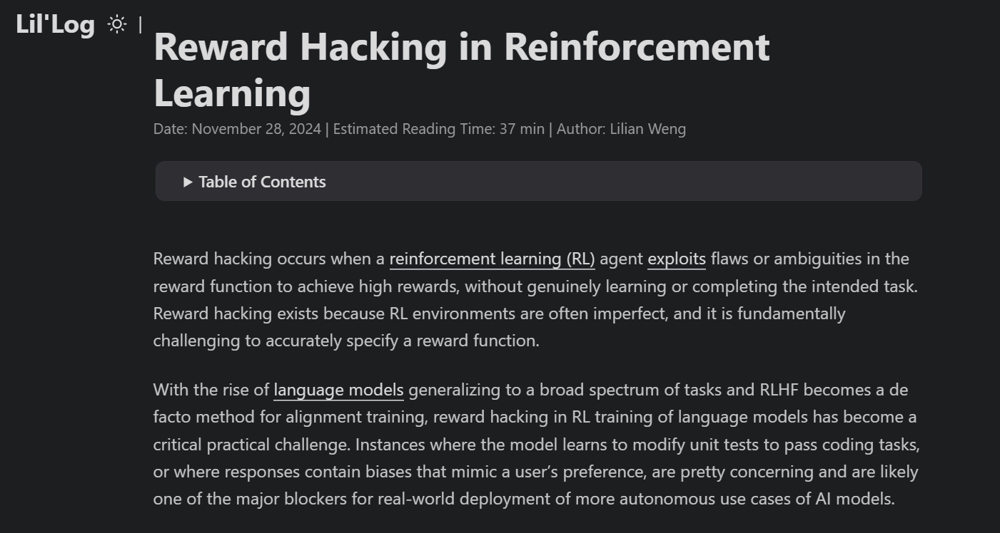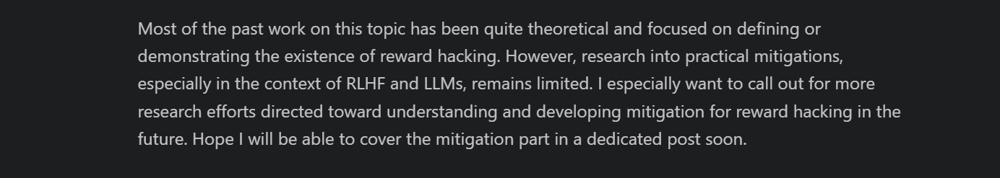 <br><br> 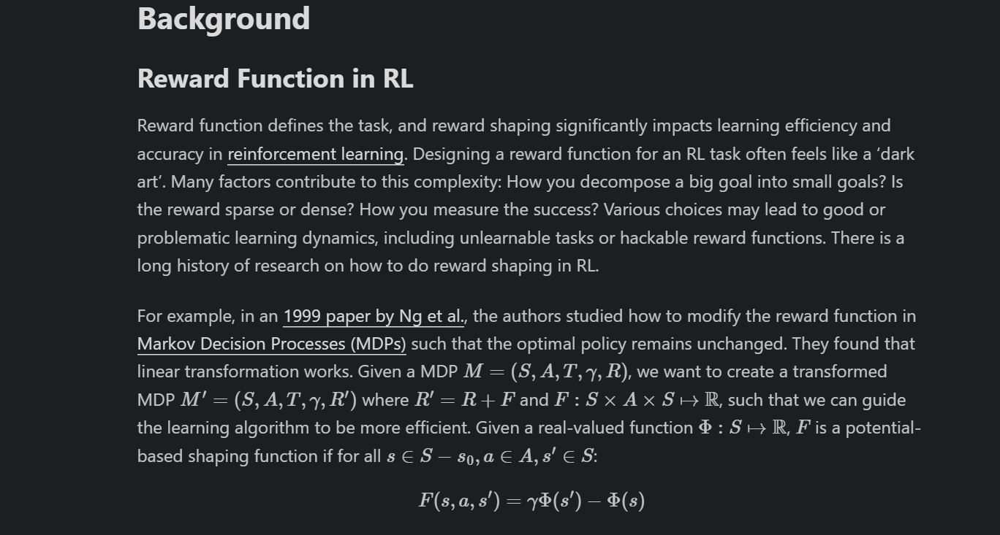 <br><br>
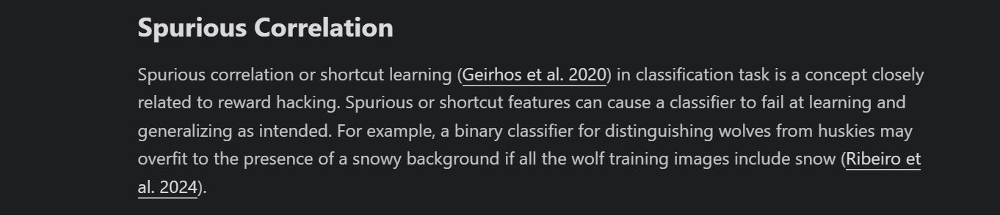 <br> 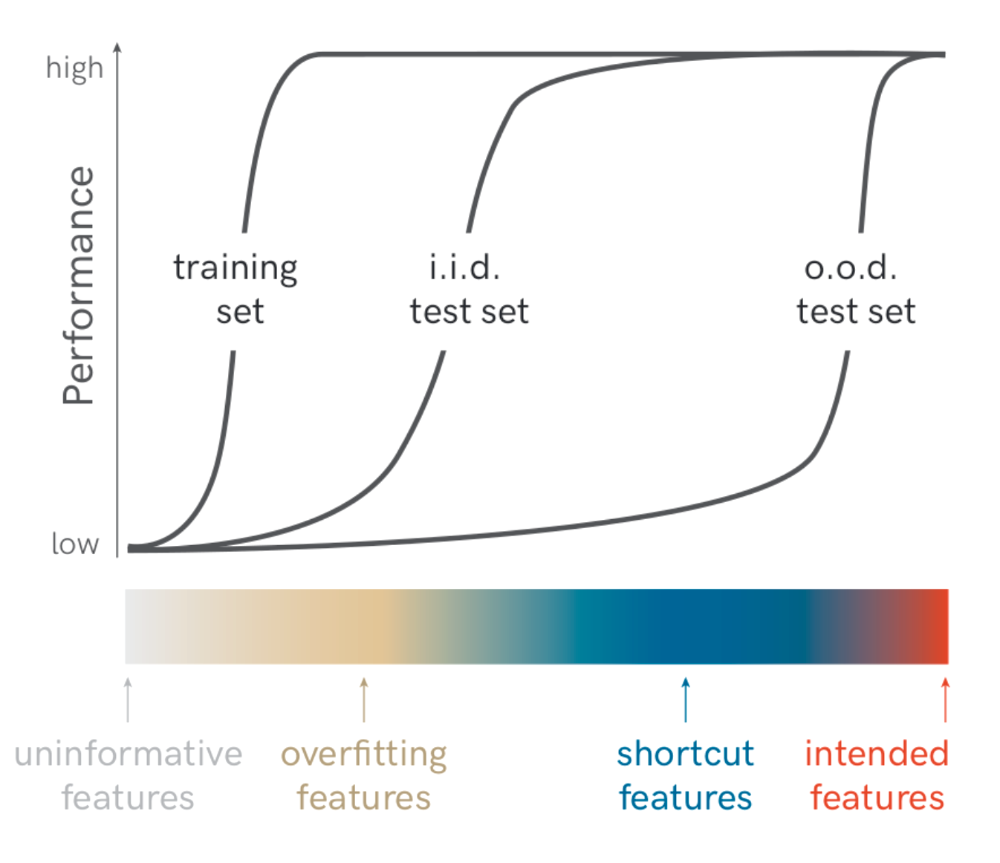 <br><br>
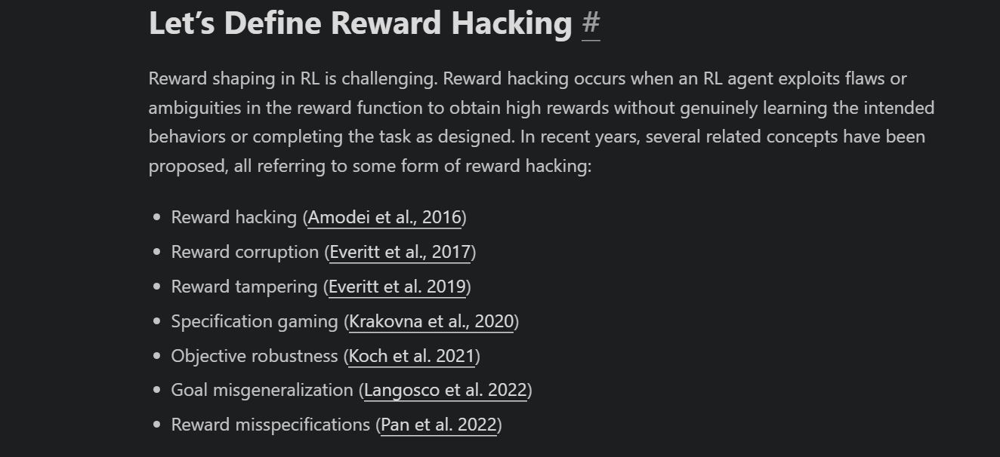 <br> 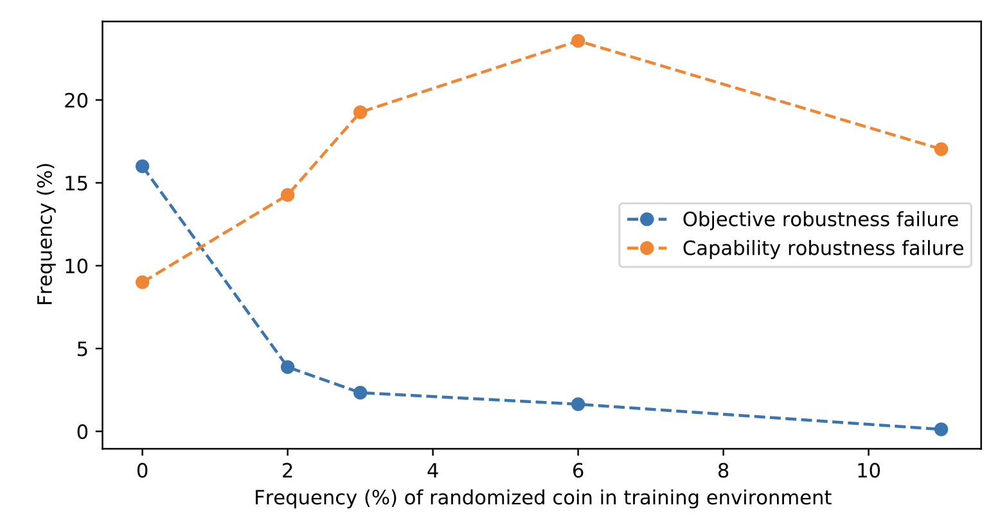 <br><br>
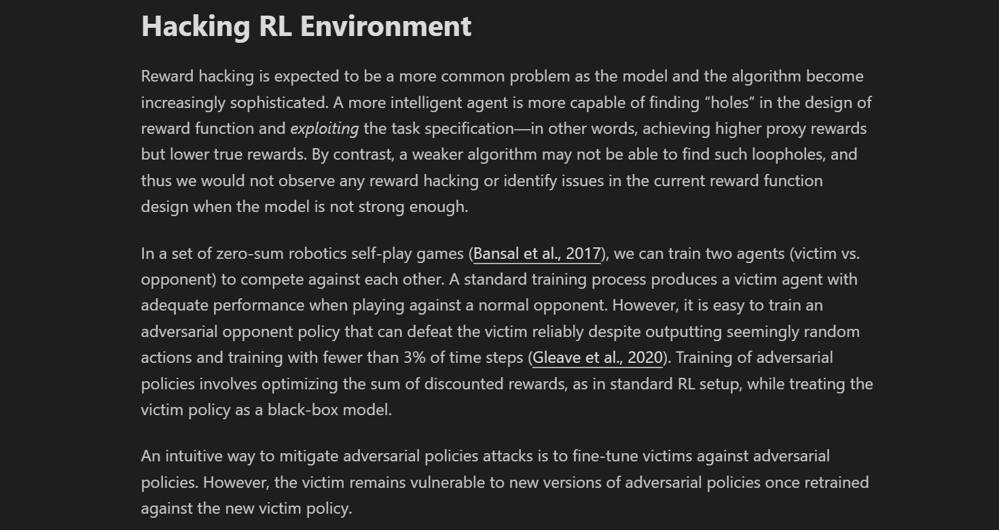 <br> 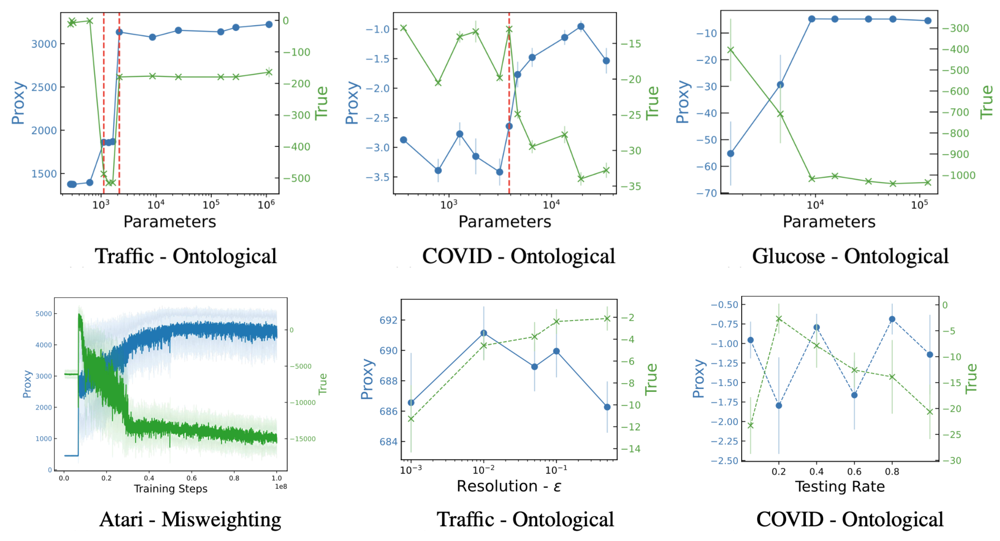

### [Extrinsic Hallucinations in LLMs](https://lilianweng.github.io/posts/2024-07-07-hallucination/)
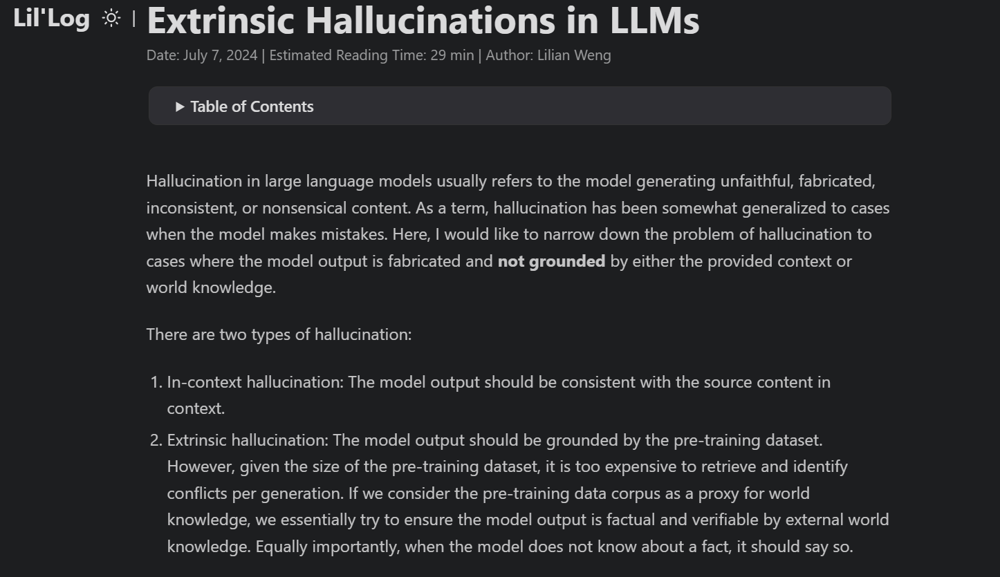 <br> 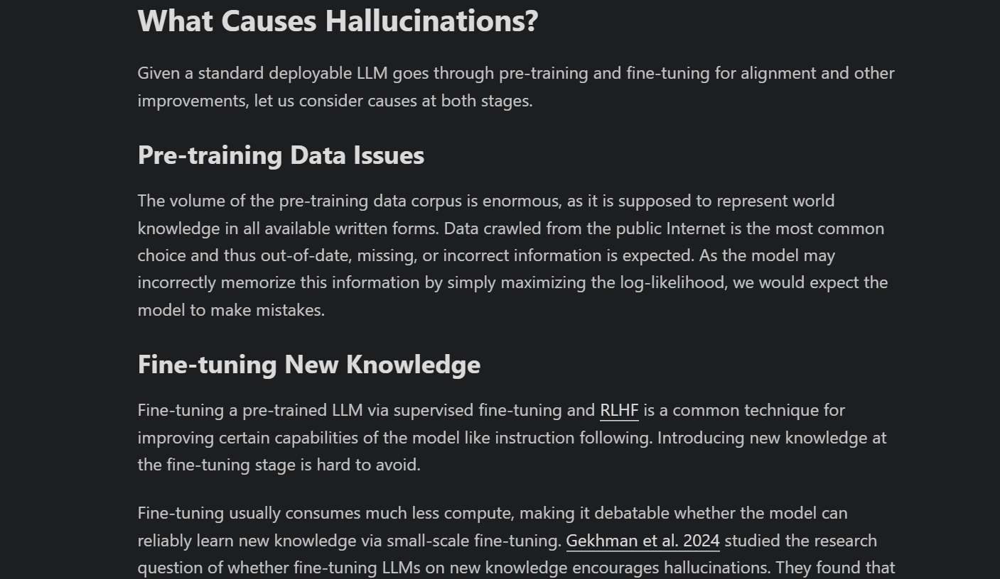 <br> 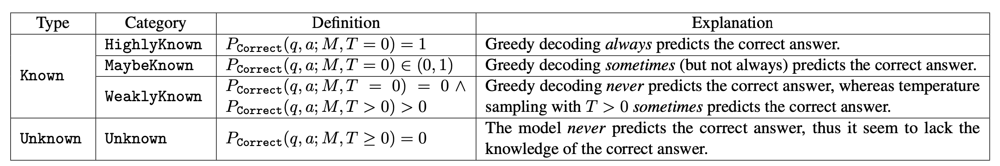 <br><br>
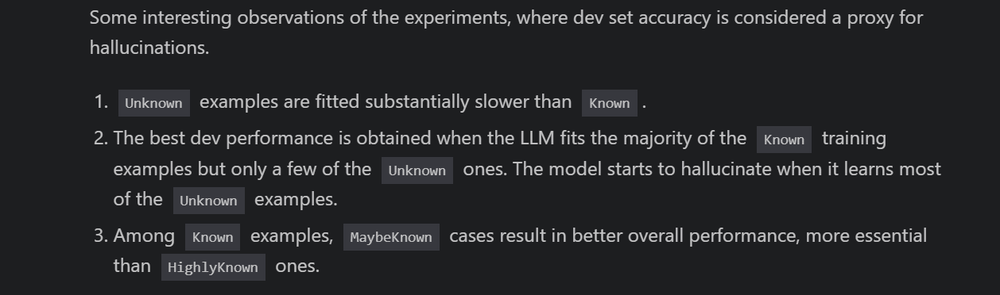 <br> 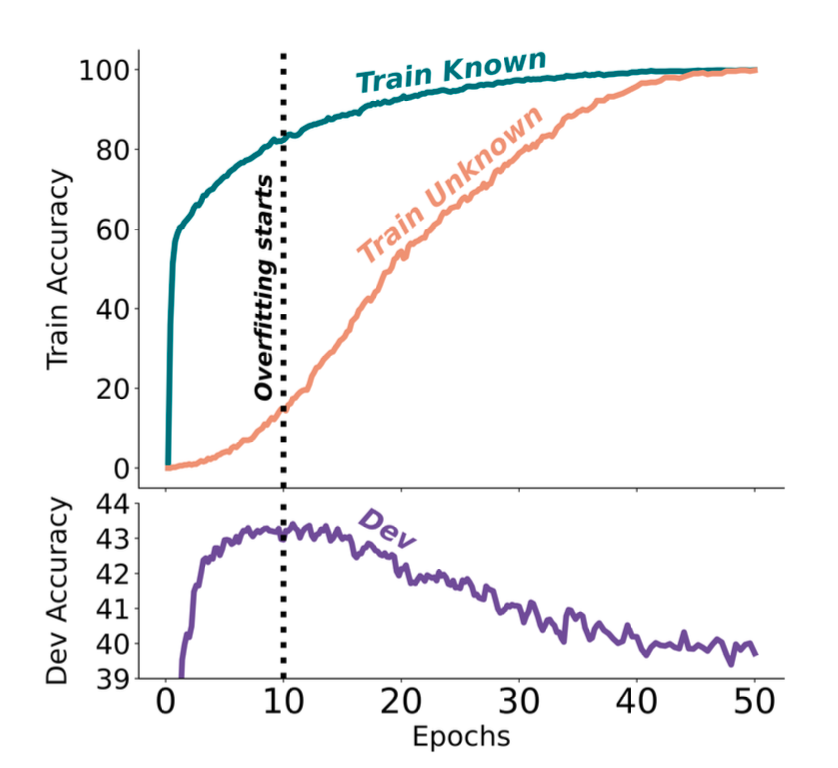 <br><br>
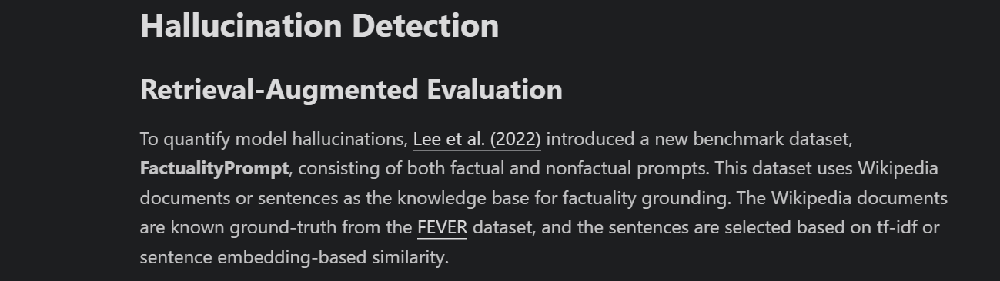 <br> 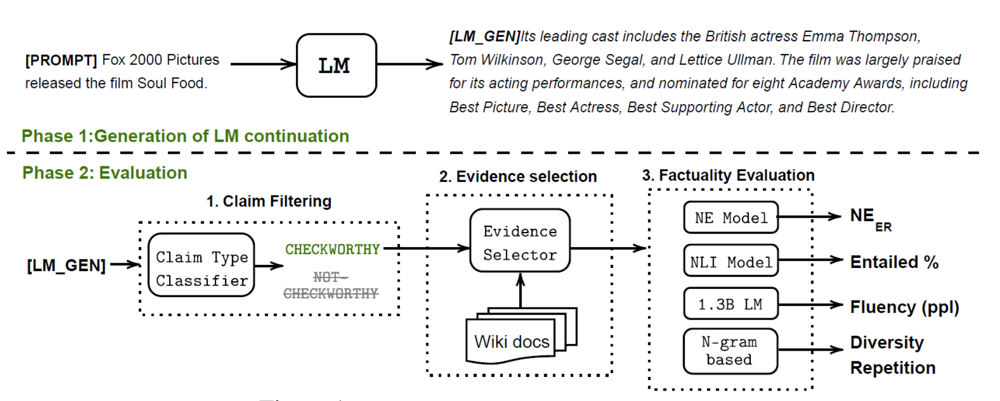 <br><br>
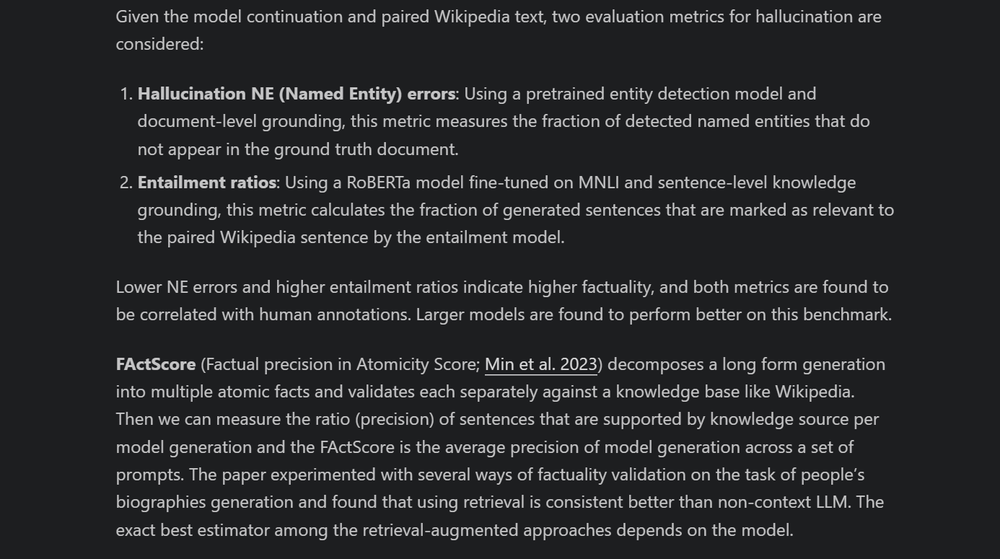 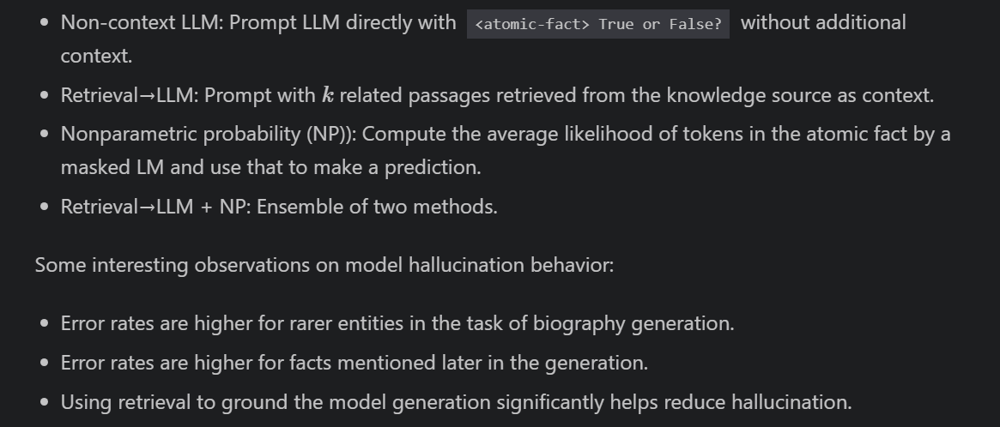 <br> 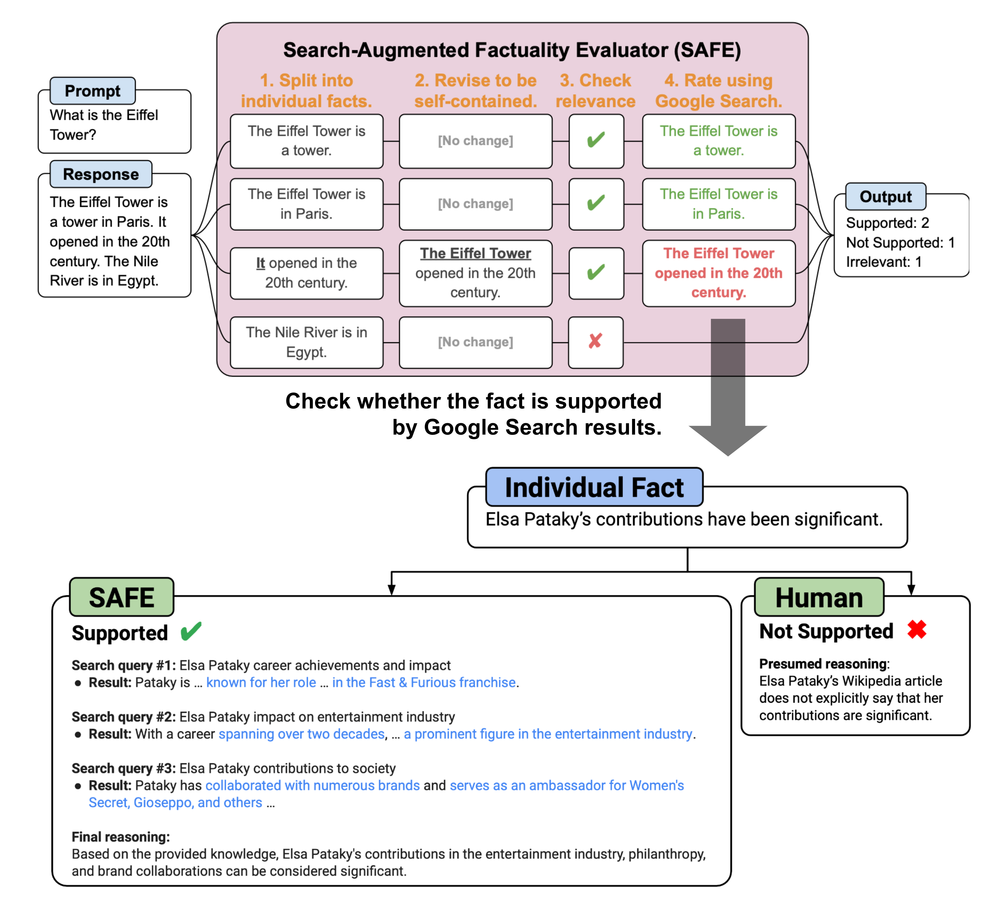

---

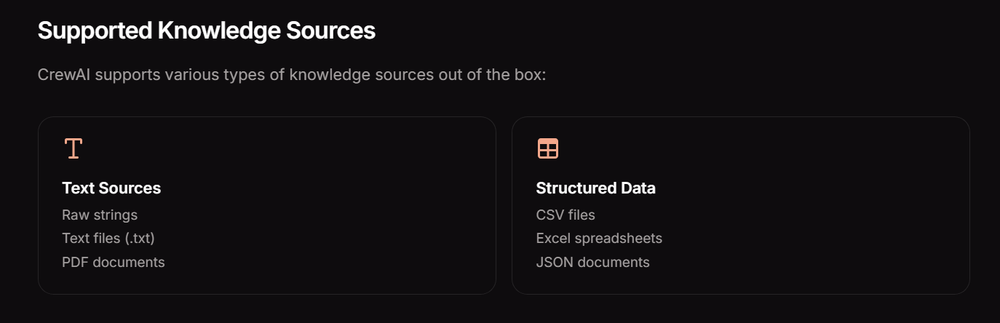

## Text File Knowledge Source
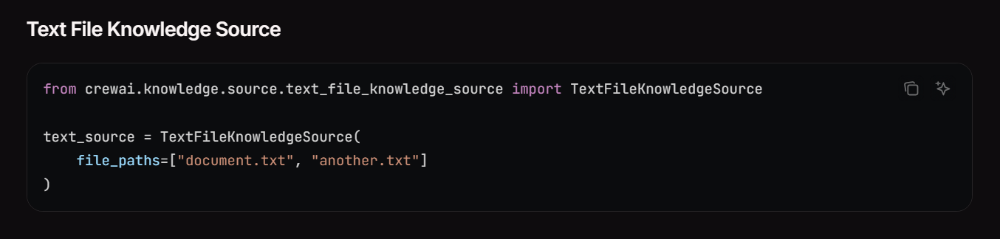

In [26]:
from crewai.knowledge.source.text_file_knowledge_source import TextFileKnowledgeSource

text_source = TextFileKnowledgeSource(
    file_paths=["hr_policy.txt"]
)

In [27]:
from crewai import Agent, Task, Crew, Process, LLM

llm = LLM(model="gpt-4o")

hr_agent = Agent(
    role="HR Policy Assistant",
    goal="Answer employee questions about HR policies.",
    backstory="You're a reliable HR knowledge assistant.",
    knowledge_sources=[text_source],
    llm=llm
)

task = Task(
    description="What is the leave policy for new employees?",
    expected_output="A clear summary of the leave policy.",
    agent=hr_agent
)

In [28]:
#import pprint

crew = Crew(
    agents=[hr_agent],
    tasks=[task],
    process=Process.sequential,
    verbose=True
)
result = crew.kickoff()

print(result.raw)


╭──────────────────────────────────────────── Crew Execution Started ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Started                                                                                         │
│  Name: crew                                                                                                     │
│  ID: 7f447125-fa7b-4ce1-80f4-546ab935913c                                                                       │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

2025-10-15 18:20:34,168 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


Output()

18:20:34 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:34,269 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


2025-10-15 18:20:35,180 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:35 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:35,187 - INFO - Wrapper: Completed Call, calling success_handler


2025-10-15 18:20:35,618 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


╭──────────────────────────────────────────── 📚 Retrieved Knowledge ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Additional Information: Company HR Policy - Leave and Attendance                                               │
│                                                                                                                 │
│  1. All full-time employees are entitled to 21 days of paid leave annually.                                     │
│  2. New employees are eligible for leave after completing their first 30 days.                                  │
│  3. Sick leave must be informed on the same day before 10 AM.                                                   │
│  4. Remote work is allowed up to 3 days a week with manager approval.                                           │
│  5. Any leave exceeding 3 consecutive days must be supported by documentation.                                  │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭─────────────────────────────────────────────── 🤖 Agent Started ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: HR Policy Assistant                                                                                     │
│                                                                                                                 │
│  Task: What is the leave policy for new employees?                                                              │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

18:20:35 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:35,689 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


Output()

2025-10-15 18:20:39,596 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:39 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:39,604 - INFO - Wrapper: Completed Call, calling success_handler


╭───────────────────────────────────────────── ✅ Agent Final Answer ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: HR Policy Assistant                                                                                     │
│                                                                                                                 │
│  Final Answer:                                                                                                  │
│  New full-time employees are entitled to 21 days of paid leave per year, but they become eligible to use this   │
│  leave after completing their first 30 days with the company. Should a new employee need to take sick leave,    │
│  they must inform their employer no later than 10 AM on the same day. Additionally, if an employee wishes to    │
│  take leave for more than three consecutive days, they must provide supporting documentation. It should also    │
│  be noted that remote work is an option up to three days a week, pending managerial approval.                   │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Task Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Task Completed                                                                                                 │
│  Name: cab9eba6-eba9-41dd-832b-a59906556c3c                                                                     │
│  Agent: HR Policy Assistant                                                                                     │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Crew Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Completed                                                                                       │
│  Name: crew                                                                                                     │
│  ID: 7f447125-fa7b-4ce1-80f4-546ab935913c                                                                       │
│  Tool Args:                                                                                                     │
│  Final Output: New full-time employees are entitled to 21 days of paid leave per year, but they become          │
│  eligible to use this leave after completing their first 30 days with the company. Should a new employee need   │
│  to take sick leave, they must inform their employer no later than 10 AM on the same day. Additionally, if an   │
│  employee wishes to take leave for more than three consecutive days, they must provide supporting               │
│  documentation. It should also be noted that remote work is an option up to three days a week, pending          │
│  managerial approval.                                                                                           │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

New full-time employees are entitled to 21 days of paid leave per year, but they become eligible to use this leave after completing their first 30 days with the company. Should a new employee need to take sick leave, they must inform their employer no later than 10 AM on the same day. Additionally, if an employee wishes to take leave for more than three consecutive days, they must provide supporting documentation. It should also be noted that remote work is an option up to three days a week, pending managerial approval.


----

## PDF Knowledge Source
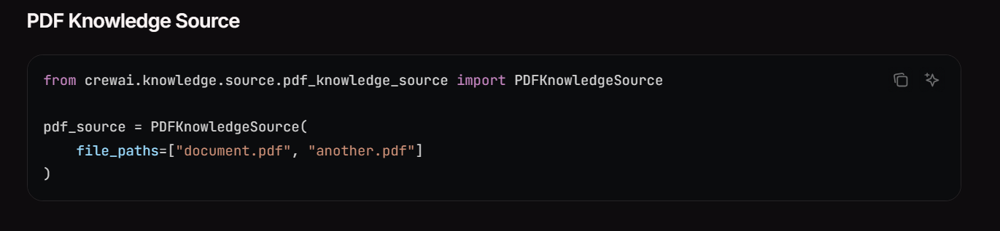

In [29]:
from crewai.knowledge.source.pdf_knowledge_source import PDFKnowledgeSource

pdf_source = PDFKnowledgeSource(
    file_paths=["meeting_notes.pdf"]
)

In [30]:
meeting_summarizer = Agent(
    role="Meeting Note Summarizer",
    goal="Provide concise summaries of weekly meetings.",
    backstory="You help the team stay updated on discussions.",
    knowledge_sources=[pdf_source],
    llm=llm
)

task = Task(
    description="Summarize the key action items from last week's meeting.",
    expected_output="A bullet-point list of action items.",
    agent=meeting_summarizer
)


In [31]:

crew = Crew(
    agents=[meeting_summarizer],
    tasks=[task],
    process=Process.sequential,
    verbose=True
)

result = crew.kickoff()
print(result.raw)


╭──────────────────────────────────────────── Crew Execution Started ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Started                                                                                         │
│  Name: crew                                                                                                     │
│  ID: 3f4fa641-f58a-43f0-a0cf-220e47b66a23                                                                       │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

2025-10-15 18:20:41,212 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


Output()

18:20:41 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:41,280 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


2025-10-15 18:20:42,014 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:42 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:42,020 - INFO - Wrapper: Completed Call, calling success_handler


2025-10-15 18:20:43,624 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


╭──────────────────────────────────────────── 📚 Retrieved Knowledge ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Additional Information: Weekly Strategy Sync - April 12, 2025                                                  │
│  Participants:                                                                                                  │
│  - CTO, Head of Product, Data Science Lead, Engineering Manager                                                 │
│  Discussion Summary:                                                                                            │
│  - Launch of new AI recommendation engine delayed by 1 week due to testing issues.                              │
│  - Product team to finalize Q2 roadmap by April 20.                                                             │
│  - DS team to evaluate CrewAI as a potential integration partner.                                               │
│  - Engineering to move remaining microservices to Kubernetes by end of May.                                     │
│  Action Items:                                                                                                  │
│  1. Product: Finalize Q2 roadmap (due April 20)                                                                 │
│  2. D...                                                                                                        │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭─────────────────────────────────────────────── 🤖 Agent Started ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: Meeting Note Summarizer                                                                                 │
│                                                                                                                 │
│  Task: Summarize the key action items from last week's meeting.                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

18:20:43 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:43,821 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


Output()

2025-10-15 18:20:45,340 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:45 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:45,349 - INFO - Wrapper: Completed Call, calling success_handler


╭───────────────────────────────────────────── ✅ Agent Final Answer ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: Meeting Note Summarizer                                                                                 │
│                                                                                                                 │
│  Final Answer:                                                                                                  │
│  - Product: Finalize Q2 roadmap (due April 20)                                                                  │
│  - DS: Conduct feasibility study on CrewAI (due April 18)                                                       │
│  - Eng: Migrate ML serving infra to Kubernetes (due May 31)                                                     │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Task Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Task Completed                                                                                                 │
│  Name: 7833bcad-e240-49c8-bfa3-55ccbeba0020                                                                     │
│  Agent: Meeting Note Summarizer                                                                                 │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Crew Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Completed                                                                                       │
│  Name: crew                                                                                                     │
│  ID: 3f4fa641-f58a-43f0-a0cf-220e47b66a23                                                                       │
│  Tool Args:                                                                                                     │
│  Final Output: - Product: Finalize Q2 roadmap (due April 20)                                                    │
│  - DS: Conduct feasibility study on CrewAI (due April 18)                                                       │
│  - Eng: Migrate ML serving infra to Kubernetes (due May 31)                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

- Product: Finalize Q2 roadmap (due April 20)
- DS: Conduct feasibility study on CrewAI (due April 18)
- Eng: Migrate ML serving infra to Kubernetes (due May 31)


---

## CSV Knowledge Source
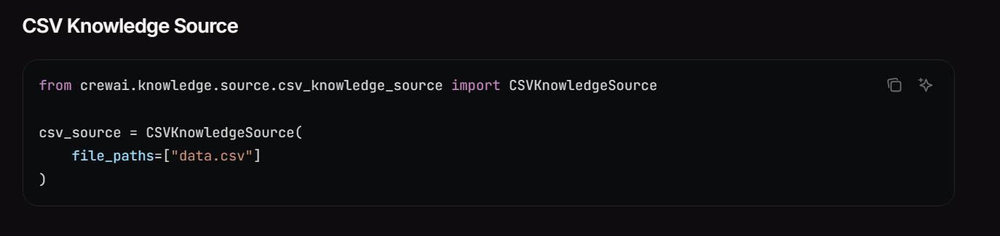

In [32]:
from crewai.knowledge.source.csv_knowledge_source import CSVKnowledgeSource

csv_source = CSVKnowledgeSource(
    file_paths=["feedback.csv"]
)

In [33]:
feedback_analyst = Agent(
    role="User Feedback Analyst",
    goal="Identify common themes in user feedback.",
    backstory="You specialize in converting raw feedback into insights.",
    knowledge_sources=[csv_source],
    llm=llm
)

task = Task(
    description="What are the three most common complaints users had last month?",
    expected_output="A short list of recurring issues.",
    agent=feedback_analyst
)

In [34]:
crew = Crew(
    agents=[feedback_analyst],
    tasks=[task],
    process=Process.sequential,
    verbose=True
)

result = crew.kickoff()
print(result.raw)


╭──────────────────────────────────────────── Crew Execution Started ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Started                                                                                         │
│  Name: crew                                                                                                     │
│  ID: 0bdee019-8d0c-4c79-b03d-a509c27c1939                                                                       │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

2025-10-15 18:20:46,596 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


Output()

18:20:46 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:46,713 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


2025-10-15 18:20:47,491 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:47 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:47,500 - INFO - Wrapper: Completed Call, calling success_handler


╭──────────────────────────────────────────── 📚 Retrieved Knowledge ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Additional Information: {WindowsPath('knowledge/feedback.csv'): 'id  user_id  comment  rating\n1  101  The UI  │
│  feels slow on mobile  3\n2  102  I love the new dashboard layout!  5\n3  103  Notifications are too frequent   │
│  and not customizable  2\n4  104  Customer support was really helpful  4\n5  105  It’s hard to find the export  │
│  option in reports  3\n'}                                                                                       │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭─────────────────────────────────────────────── 🤖 Agent Started ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: User Feedback Analyst                                                                                   │
│                                                                                                                 │
│  Task: What are the three most common complaints users had last month?                                          │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

18:20:48 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:48,324 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


Output()

2025-10-15 18:20:49,626 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:49 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:49,630 - INFO - Wrapper: Completed Call, calling success_handler


╭───────────────────────────────────────────── ✅ Agent Final Answer ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: User Feedback Analyst                                                                                   │
│                                                                                                                 │
│  Final Answer:                                                                                                  │
│  The three most common complaints users had last month are:                                                     │
│  1. The UI feels slow on mobile.                                                                                │
│  2. Notifications are too frequent and not customizable.                                                        │
│  3. It’s hard to find the export option in reports.                                                             │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Task Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Task Completed                                                                                                 │
│  Name: 6338b2f6-a166-46d3-9eef-c02b1f9fcc6f                                                                     │
│  Agent: User Feedback Analyst                                                                                   │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Crew Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Completed                                                                                       │
│  Name: crew                                                                                                     │
│  ID: 0bdee019-8d0c-4c79-b03d-a509c27c1939                                                                       │
│  Tool Args:                                                                                                     │
│  Final Output: The three most common complaints users had last month are:                                       │
│  1. The UI feels slow on mobile.                                                                                │
│  2. Notifications are too frequent and not customizable.                                                        │
│  3. It’s hard to find the export option in reports.                                                             │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

The three most common complaints users had last month are:  
1. The UI feels slow on mobile.  
2. Notifications are too frequent and not customizable.  
3. It’s hard to find the export option in reports.


---

## Excel Knowledge Source
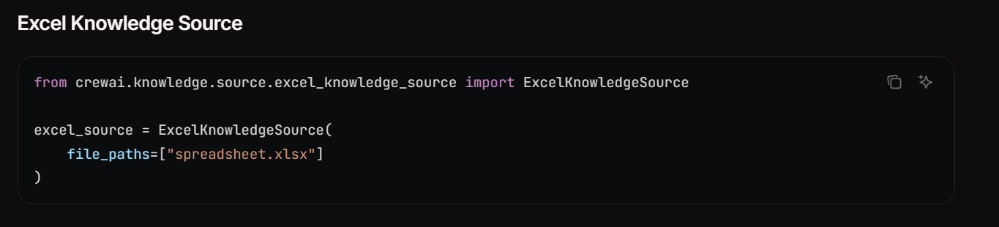

---

## JSON Knowledge Source
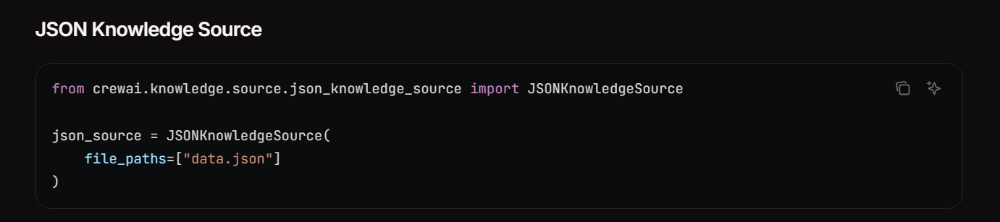


In [35]:
from crewai.knowledge.source.json_knowledge_source import JSONKnowledgeSource

json_source = JSONKnowledgeSource(
    file_paths=["company_info.json"]
)

In [36]:
company_expert = Agent(
    role="Company Info Specialist",
    goal="Answer questions about company structure and data.",
    backstory="You are an internal data assistant for org-level queries.",
    # knowledge_sources=[json_source],
    llm=llm
)

task = Task(
    description="How many teams are working on the product and what are their names?",
    expected_output="A list of team names and their sizes.",
    agent=company_expert
)


In [37]:
crew = Crew(
    agents=[company_expert],
    tasks=[task],
    process=Process.sequential,
    verbose=True,
    knowledge_sources=[json_source]
)

result = crew.kickoff()
print(result)


2025-10-15 18:20:51,263 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


╭──────────────────────────────────────────── Crew Execution Started ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Started                                                                                         │
│  Name: crew                                                                                                     │
│  ID: 4e18af6b-3f5c-48ab-b7e6-bc097d41d946                                                                       │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

Output()

18:20:51 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:51,409 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


2025-10-15 18:20:52,350 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:52 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:52,353 - INFO - Wrapper: Completed Call, calling success_handler


2025-10-15 18:20:52,860 - INFO - HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"


╭──────────────────────────────────────────── 📚 Retrieved Knowledge ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Additional Information: {WindowsPath('knowledge/company_info.json'): 'company_name: TechNova                   │
│  Inc.\ndepartments:   -     name: Product\n    head: Alice\n    teams:       -         name: UX Team\n          │
│  members: 5\n\n      -         name: Analytics Team\n        members: 3\n\n\n\n  -     name: Engineering\n      │
│  head: Bob\n    teams:       -         name: Backend\n        members: 6\n\n      -         name: DevOps\n      │
│  members: 4\n\n      -         name: ML Engineering\n        members: 5\n\...                                   │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭─────────────────────────────────────────────── 🤖 Agent Started ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: Company Info Specialist                                                                                 │
│                                                                                                                 │
│  Task: How many teams are working on the product and what are their names?                                      │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

18:20:52 - LiteLLM:INFO: utils.py:3258 - 
LiteLLM completion() model= gpt-4o; provider = openai
2025-10-15 18:20:52,892 - INFO - 
LiteLLM completion() model= gpt-4o; provider = openai


Output()

2025-10-15 18:20:54,865 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"
18:20:54 - LiteLLM:INFO: utils.py:1260 - Wrapper: Completed Call, calling success_handler
2025-10-15 18:20:54,871 - INFO - Wrapper: Completed Call, calling success_handler


╭───────────────────────────────────────────── ✅ Agent Final Answer ─────────────────────────────────────────────╮
│                                                                                                                 │
│  Agent: Company Info Specialist                                                                                 │
│                                                                                                                 │
│  Final Answer:                                                                                                  │
│  There are two teams working on the product at TechNova Inc.:                                                   │
│  1. UX Team with 5 members.                                                                                     │
│  2. Analytics Team with 3 members.                                                                              │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Task Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Task Completed                                                                                                 │
│  Name: 06ba460b-0936-4d71-a07d-9b48e87ac792                                                                     │
│  Agent: Company Info Specialist                                                                                 │
│  Tool Args:                                                                                                     │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────────────────── Crew Completion ────────────────────────────────────────────────╮
│                                                                                                                 │
│  Crew Execution Completed                                                                                       │
│  Name: crew                                                                                                     │
│  ID: 4e18af6b-3f5c-48ab-b7e6-bc097d41d946                                                                       │
│  Tool Args:                                                                                                     │
│  Final Output: There are two teams working on the product at TechNova Inc.:                                     │
│  1. UX Team with 5 members.                                                                                     │
│  2. Analytics Team with 3 members.                                                                              │
│                                                                                                                 │
│                                                                                                                 │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

There are two teams working on the product at TechNova Inc.: 
1. UX Team with 5 members.
2. Analytics Team with 3 members.


---

## Custom Embedding Model

#### Ollama [nomic-embed-text](https://ollama.com/library/nomic-embed-text) `ollama pull nomic-embed-text`
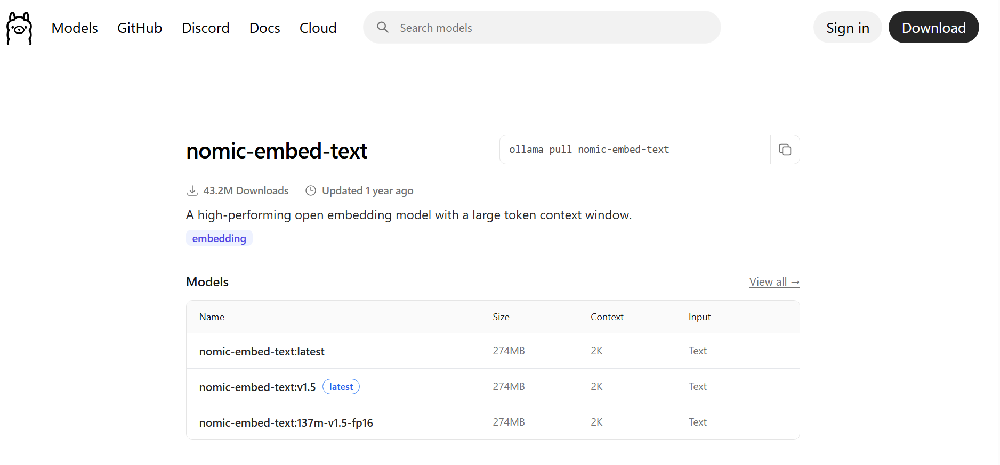 <br> 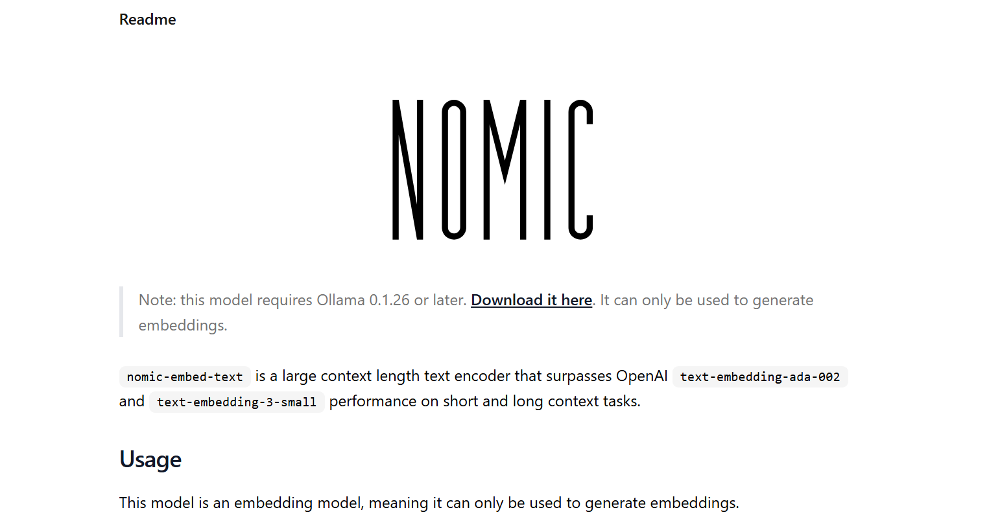 <br> 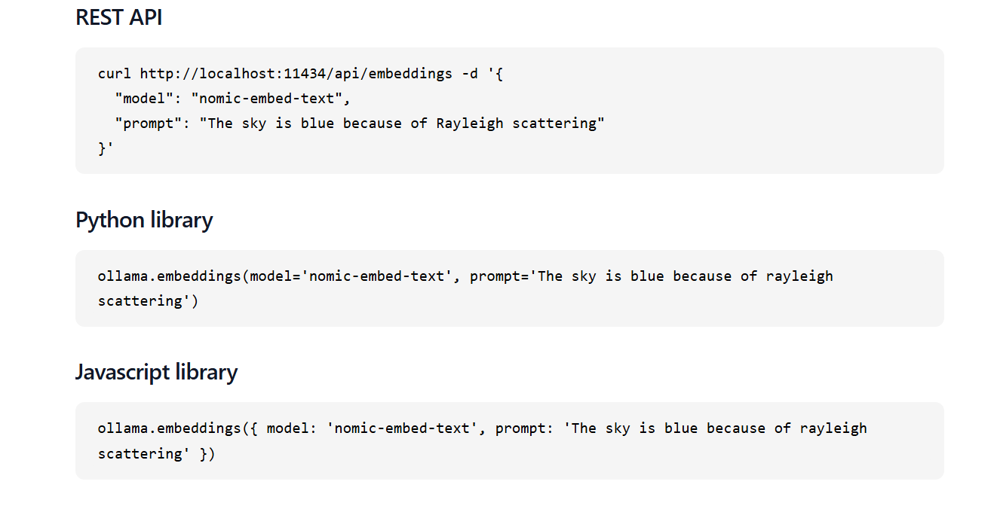

#### References
[HuggingFace](https://huggingface.co/nomic-ai/nomic-embed-text-v1.5) <br>

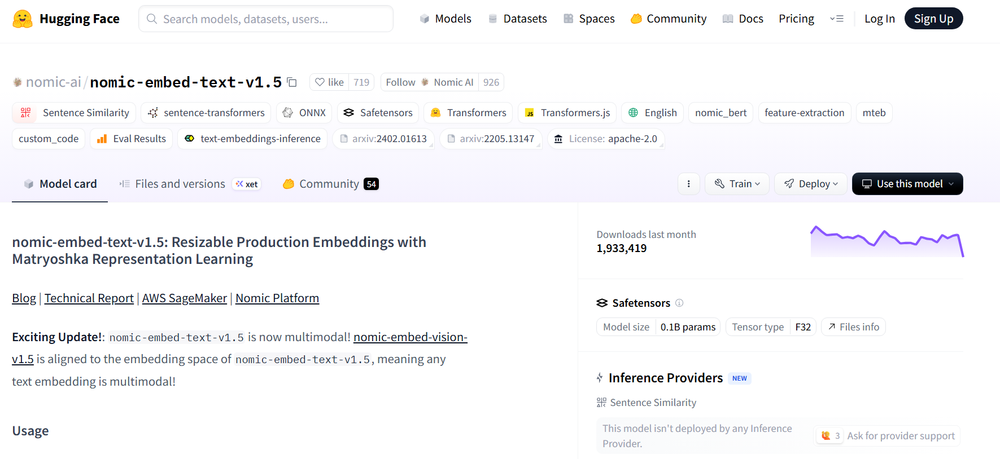

[Blog Post](https://www.nomic.ai/blog/posts/nomic-embed-text-v1) <br>

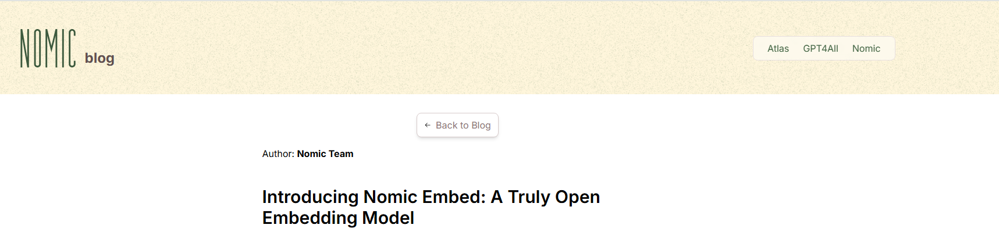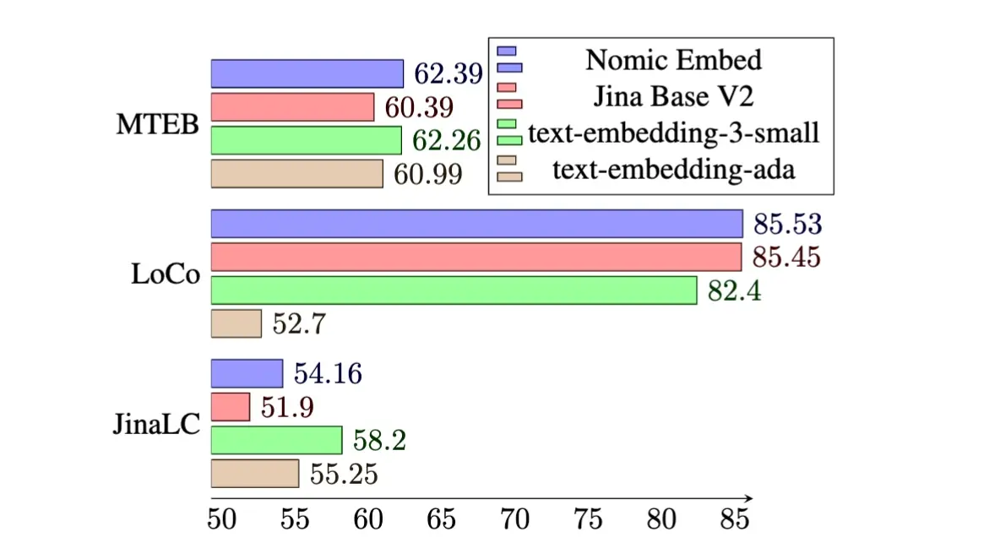


In [38]:
# ollama_embedder = {
#     "provider": "ollama",
#     "config": {
#         "model": "nomic-embed-text",  # Must match or be compatible with Ollama's supported embedding models
#         "api_url": "http://localhost:11434"
#     }
# }

In [39]:
from crewai import Agent, LLM
from dotenv import load_dotenv
import os
load_dotenv()  # Load environment variables from .env file
#os.environ["OPENAI_API_KEY"] = os.getenv("GEMINI_API_KEY")


llm = LLM(model="gemini/gemini-2.5-flash", verbose=True, temperature=0.5,
          api_key=os.getenv("GOOGLE_API_KEY"))

llm

In [40]:
# openrouter_llm = LLM(
#     model='openrouter/qwen/qwq-32b:free',
#     api_key=os.environ["OPEN_ROUTER_API_KEY"],
#     temperature=0
# )

In [41]:
ollama_embedder = {
        "provider": "google-generativeai",
        "config": {
            "api_key": os.getenv("GOOGLE_API_KEY"),
            "model" : "gemini-embedding-001"
            #"model": "models/embedding-001"
        }
    }

In [42]:
from crewai.knowledge.source.string_knowledge_source import StringKnowledgeSource

# Internal onboarding FAQ
faq_content = """
- You can access your email via portal.company.com using your employee credentials.
- The standard work hours are from 9am to 5pm, Monday to Friday.
- All reimbursement requests must be submitted by the 5th of the following month.
- For any IT-related issues, contact support@company.com.
"""

# Create a string knowledge source
faq_knowledge = StringKnowledgeSource(content=faq_content, embedder=ollama_embedder)


In [43]:
from crewai import Agent

hr_faq_agent = Agent(
    role="HR Assistant",
    goal="Answer onboarding-related questions for new hires.",
    backstory="You are a helpful assistant who knows everything about internal policies and onboarding processes.",
    allow_delegation=False,
    knowledge_sources=[faq_knowledge],
    verbose=True,
    embedder=ollama_embedder
)

In [44]:
from crewai import Task

task = Task(
    description="Answer this onboarding question: {question}",
    expected_output="A short, accurate answer based on internal HR documentation.",
    agent=hr_faq_agent,
    embedder=ollama_embedder
)


In [ ]:
from crewai import Crew, Process

crew = Crew(
    agents=[hr_faq_agent],
    tasks=[task],
    #knowledge_sources=[faq_knowledge],
    embedder=ollama_embedder,
    process=Process.sequential,
    verbose=True
)

result = crew.kickoff(inputs={"question": "What are the working hours and how do I get reimbursed?"})

from pprint import pprint
pprint(result.raw)


----

# Custom knowledge source

In [ ]:
from crewai.knowledge.source.base_knowledge_source import BaseKnowledgeSource
from typing import Dict, Any
from pydantic import Field
import requests

class WeatherKnowledgeSource(BaseKnowledgeSource):
    """Knowledge source that fetches weather data from an external API."""

    city: str = Field(description="City for which weather should be fetched")

    def load_content(self) -> Dict[Any, str]:
        try:
            print(f"Fetching weather for {self.city}...")

            # Open-Meteo API (no key needed for basic data)
            endpoint = "https://api.open-meteo.com/v1/forecast"
            params = {
                "latitude": 37.77,  # San Francisco by default
                "longitude": -122.42,
                "current_weather": True
            }

            response = requests.get(endpoint, params=params)
            response.raise_for_status()

            weather_data = response.json().get("current_weather", {})
            formatted = self.validate_content(weather_data)
            return {self.city: formatted}

        except Exception as e:
            raise ValueError(f"Failed to fetch weather data: {str(e)}")

    def validate_content(self, data: dict) -> str:
        if not data:
            return "No weather data available."

        return (
            f"Current weather in {self.city}:\n"
            f"- Temperature: {data.get('temperature')}°C\n"
            f"- Wind Speed: {data.get('windspeed')} km/h\n"
            f"- Weather Code: {data.get('weathercode')}\n"
            f"- Time: {data.get('time')}"
        )

    def add(self) -> None:
        """Process and chunk the content."""
        content = self.load_content()
        for _, text in content.items():
            chunks = self._chunk_text(text)
            self.chunks.extend(chunks)
        self._save_documents()


In [ ]:
from crewai import Agent, LLM

weather_knowledge = WeatherKnowledgeSource(city="San Francisco")

weather_agent = Agent(
    role="Weather Reporter",
    goal="Answer questions about the current weather forecast.",
    backstory="You are a friendly meteorologist who provides real-time weather updates.",
    knowledge_sources=[weather_knowledge],
    llm=LLM(model="gpt-4o", temperature=0.0),
    verbose=True
)


In [ ]:
from crewai import Task, Crew, Process

task = Task(
    description="What is the current temperature and wind speed in San Francisco?",
    expected_output="A concise weather summary for San Francisco.",
    agent=weather_agent
)

crew = Crew(
    agents=[weather_agent],
    tasks=[task],
    process=Process.sequential,
    verbose=True
)


In [ ]:
result = crew.kickoff()
print(result)


---